## This project tackles the challenge of transparency within the context of In vitro Fertilization (IVF), with a specific focus on the segmentation of human embryos—a pivotal step in identifying viable candidates for implantation. In IVF procedures, segmentation plays a pivotal role in assessing embryo viability. By delineating the embryo into distinct regions like the Inner Cell Mass (ICM), Zona Pellucida (ZP), and Trophectoderm (TE), clinicians can determine which embryos are suitable for implantation, thus improving the chances of a successful pregnancy.
## While achieving accurate segmentation is crucial, it is equally vital to grasp the thought process behind the segmentation model’s decisions.
# This notebook is the implementation of the U-NET segmentation model on embryo images to highlight 3 different regions in the embryo (ICM-ZP-TE). GradCAM was also applied for explainability

## PS: ! The models were trained for 75 epochs and then saved to be loaded in this notebook for inference. !

In [1]:
!pip install augmentor

In [3]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import Augmentor

In [ ]:
import tensorflow as tf
from tensorflow.keras import models
from tensorflow.keras.layers import *
from tensorflow.keras.activations import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras import Model
import cv2
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import gc
from tensorflow.keras.optimizers import Adam
import random
from glob import glob
import Augmentor

2024-06-06 03:10:59.309839: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-06 03:10:59.309938: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-06 03:10:59.436231: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Loading images and masks

## Images

(50, 336, 336, 1)


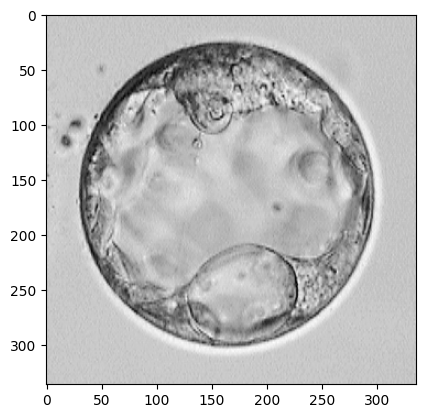

In [ ]:
imgs = []
folder = "/kaggle/input/segmentation/Images"
files=sorted(glob(os.path.join(folder,"*")))
for filename in files:
    if filename.endswith(".BMP"):
        # Load the image in grayscale
        img= Image.open(filename).convert('L')
        img = img.resize((336,336))
        img = np.array(img)
        #img = np.expand_dims(img, axis=-1)
        imgs.append(img)

split1 = int(0.8 * len(imgs))
test_img = np.expand_dims(np.array(imgs[split1:])/255 , axis=-1)
imgs = np.array(imgs[:split1])
print(test_img.shape)
plt.imshow(img, cmap="gray")

## ICM masks

(50, 336, 336, 1)


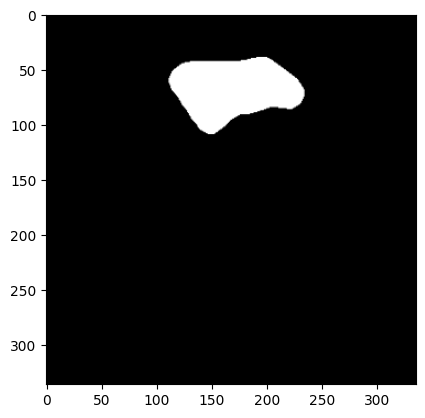

In [ ]:
icms = []
folder = "/kaggle/input/segmentation/GT_ICM"
files=sorted(glob(os.path.join(folder,"*")))
for filename in files:
    if filename.endswith(".bmp"):
        # Load the image in grayscale
        img= Image.open(filename).convert('L')
        img = img.resize((336,336))
        img = np.array(img)
        #img = np.expand_dims(img, axis=-1)
        icms.append(img)

split1 = int(0.8 * len(icms))
test_icm = np.expand_dims(np.array(icms[split1:])/255 , axis=-1)
icms = np.array(icms[:split1])
print(test_icm.shape)
plt.imshow(img, cmap="gray")

## GT_TE

(50, 336, 336, 1)


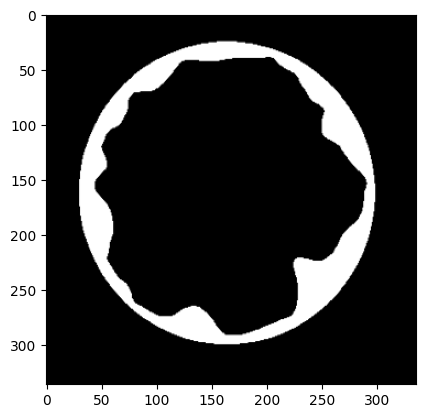

In [ ]:
tes=[]
folder = "/kaggle/input/segmentation/GT_TE"
files=sorted(glob(os.path.join(folder,"*")))
for filename in files:
    if filename.endswith(".bmp"):
        # Load the image in grayscale
        img= Image.open(filename).convert('L')
        img = img.resize((336,336))
        img = np.array(img)
        #img = np.expand_dims(img, axis=-1)
        tes.append(img)

split1 = int(0.8 * len(tes))
test_te = np.expand_dims(np.array(tes[split1:])/255 , axis=-1)
tes = np.array(tes[:split1])
print(test_te.shape)
plt.imshow(img, cmap="gray")

## GT_ZP

(50, 336, 336, 1)


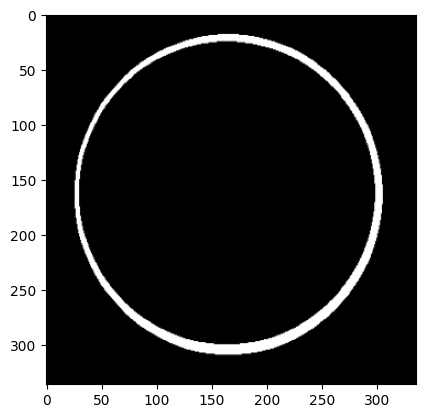

In [ ]:
zps=[]
folder = "/kaggle/input/segmentation/GT_ZP"
files=sorted(glob(os.path.join(folder,"*")))
for filename in files:
    if filename.endswith(".bmp"):
        # Load the image in grayscale
        img= Image.open(filename).convert('L')
        img = img.resize((336,336))
        img = np.array(img)
        #img = np.expand_dims(img, axis=-1)
        zps.append(img)

split1 = int(0.8 * len(zps))
test_zp = np.expand_dims(np.array(zps[split1:])/255 , axis=-1)
zps = np.array(zps[:split1])
print(test_zp.shape)
plt.imshow(img, cmap="gray")

# Data augmentation

In [ ]:
aug = np.array([[img, icm, zp, te] for img, icm, zp, te in zip(imgs, icms, zps, tes)])
aug.shape

(198, 4, 336, 336)

In [ ]:
p = Augmentor.DataPipeline(aug)
p.rotate(1, max_left_rotation=10, max_right_rotation=10)
p.flip_left_right(probability=0.5)
p.flip_top_bottom(probability=0.5)
augmented_images = p.sample(1000)
aug = np.array(augmented_images)

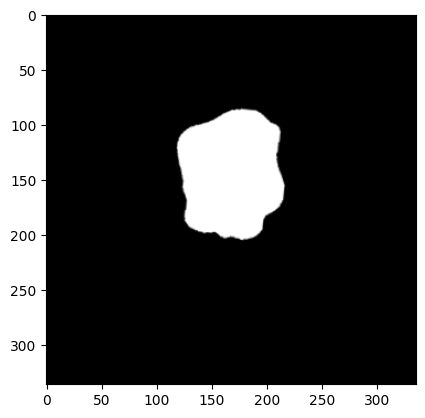

In [ ]:
imgs = np.array([np.expand_dims(row[0], axis=-1)/255 for row in aug])
icms = np.array([np.expand_dims(row[1], axis=-1)/255 for row in aug])
zps = np.array([np.expand_dims(row[2], axis=-1)/255 for row in aug])
tes = np.array([np.expand_dims(row[3], axis=-1)/255 for row in aug])
plt.imshow(icms[0],cmap="gray")

## Preparing train sets for one class segmentation

In [ ]:
data_icm = list(zip(imgs, icms))
data_icm = shuffle(data_icm, random_state = 42)
train_icm = np.array(data_icm)

data_zp = list(zip(imgs, zps))
data_zp = shuffle(data_zp, random_state = 42)
train_zp = np.array(data_zp)

data_te = list(zip(imgs, tes))
data_te = shuffle(data_te, random_state = 42)
train_te = np.array(data_te)


print(train_icm[:,0].shape)

(1000, 336, 336, 1)


## Preparing train sets for multi-class segmentation

In [ ]:
#background mask

bg = np.array(1-(icms+zps+tes))
bg[bg<0]=0

In [ ]:
X_multi = imgs
y_multi = np.stack([icms, zps,tes,bg], axis=-1)
y_multi = np.reshape(y_multi, (1000, 336,336, 4))

# UNET model definition

In [ ]:
def down_block(x, filters, use_maxpool = True):
    x = Conv2D(filters, 3, padding= 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Conv2D(filters, 3, padding= 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    if use_maxpool == True:
        return  MaxPooling2D(strides= (2,2))(x), x
    else:
        return x

In [ ]:
def up_block(x,y, filters):
    x=Conv2DTranspose(filters,(2,2),strides=2,padding="same")(x)
    x = Concatenate(axis = 3)([x,y])
    x = Conv2D(filters, 3, padding= 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Conv2D(filters, 3, padding= 'same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    return x

In [ ]:
def Unet(input_size = (256, 256, 1), *, classes, dropout):
    filter = [64,128,256,512, 1024]
    # encode
    input = Input(shape = input_size)
    x, temp1 = down_block(input, filter[0])
    x, temp2 = down_block(x, filter[1])
    x, temp3 = down_block(x, filter[2])
    x, temp4 = down_block(x, filter[3])
    x = down_block(x, filter[4], use_maxpool= False)
    # decode
    x = up_block(x, temp4, filter[3])
    x = up_block(x, temp3, filter[2])
    x = up_block(x, temp2, filter[1])
    x = up_block(x, temp1, filter[0])
    x = Dropout(dropout)(x)
    output = Conv2D(1, 1, activation= None)(x)
    output = tf.keras.activations.sigmoid(output)
    model = models.Model(input, output, name = 'unet')
    model.summary()
    return model
def Unet_multiclass(input_size = (256, 256, 1), *, classes, dropout):
    filter = [64,128,256,512, 1024]
    # encode
    input = Input(shape = input_size)
    x, temp1 = down_block(input, filter[0])
    x, temp2 = down_block(x, filter[1])
    x, temp3 = down_block(x, filter[2])
    x, temp4 = down_block(x, filter[3])
    x = down_block(x, filter[4], use_maxpool= False)
    # decode
    x = up_block(x, temp4, filter[3])
    x = up_block(x, temp3, filter[2])
    x = up_block(x, temp2, filter[1])
    x = up_block(x, temp1, filter[0])
    x = Dropout(dropout)(x)
    output = Conv2D(classes, 1, activation= 'softmax')(x)
    model = models.Model(input, output, name = 'unet_multi')
    model.summary()
    return model

In [ ]:
inp_size = (336,336, 1)
unet_icm = Unet(inp_size, classes= 2, dropout= 0.2)
unet_zp = Unet(inp_size, classes= 2, dropout= 0.2)
unet_te = Unet(inp_size, classes= 2, dropout= 0.2)
unet_multi = Unet_multiclass(inp_size, classes = 4, dropout = 0.2)

Model: "unet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 336, 336,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 336, 336,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 336, 336,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 336, 336,  │     36,928 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 168, 168,  │          0 │ leaky_re_lu_1[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 168, 168,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 168, 168,  │    147,584 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 84, 84,    │          0 │ leaky_re_lu_3[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 84, 84,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 84, 84,    │      1,024 │ conv2d_4[0][0]  

 Total params: 31,054,145 (118.46 MB)

 Trainable params: 31,042,369 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Model: "unet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 336, 336,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 336, 336,  │        640 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_18      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 336, 336,  │     36,928 │ leaky_re_lu_18[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_19      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 168, 168,  │          0 │ leaky_re_lu_19[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 168, 168,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_20      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 168, 168,  │    147,584 │ leaky_re_lu_20[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_21      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 84, 84,    │          0 │ leaky_re_lu_21[0… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 84, 84,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 84, 84,    │      1,024 │ conv2d_23[0][0] 

 Total params: 31,054,145 (118.46 MB)

 Trainable params: 31,042,369 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Model: "unet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 336, 336,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 336, 336,  │        640 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_38[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_36      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 336, 336,  │     36,928 │ leaky_re_lu_36[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_39[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_37      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 168, 168,  │          0 │ leaky_re_lu_37[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 168, 168,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_40[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_38      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 168, 168,  │    147,584 │ leaky_re_lu_38[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_41[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_39      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 84, 84,    │          0 │ leaky_re_lu_39[0… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 84, 84,    │    295,168 │ max_pooling2d_9[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 84, 84,    │      1,024 │ conv2d_42[0][0] 

 Total params: 31,054,145 (118.46 MB)

 Trainable params: 31,042,369 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Model: "unet_multi"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 336, 336,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 336, 336,  │        640 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_57[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_54      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 336, 336,  │     36,928 │ leaky_re_lu_54[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 336, 336,  │        256 │ conv2d_58[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_55      │ (None, 336, 336,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 168, 168,  │          0 │ leaky_re_lu_55[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 168, 168,  │     73,856 │ max_pooling2d_12… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_59[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_56      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 168, 168,  │    147,584 │ leaky_re_lu_56[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 168, 168,  │        512 │ conv2d_60[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_57      │ (None, 168, 168,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_13    │ (None, 84, 84,    │          0 │ leaky_re_lu_57[0… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 84, 84,    │    295,168 │ max_pooling2d_13… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 84, 84,    │      1,024 │ conv2d_61[0][0] 

 Total params: 31,054,340 (118.46 MB)

 Trainable params: 31,042,564 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
metrics = ["acc",
           tf.keras.metrics.IoU(num_classes=2, target_class_ids=[0,1]),]
metrics_multi = ["acc",
           tf.keras.metrics.IoU(num_classes=4, target_class_ids=[0,1,2,3]),]
unet_icm.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=metrics)
unet_zp.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=metrics)
unet_te.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=metrics)
unet_multi.compile(optimizer=Adam(learning_rate = 0.0001), loss="crossentropy", metrics=metrics)

In [ ]:
gc.collect()

52

# Training data for icm segmentation

In [ ]:
### example on icm

X_train_icm,y_train_icm = train_icm[:,0], train_icm[:,1]
print(X_train_icm.shape, y_train_icm.shape)
print(y_train_icm.max())

(1000, 336, 336, 1) (1000, 336, 336, 1)
1.0


## Loading unet_icm weights

In [ ]:
unet_icm.load_weights("/kaggle/working/unet_icm.weights.h5")

/opt/conda/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 166 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


# Training data for ZP segmentation

In [ ]:

X_train_zp, y_train_zp = train_zp[:,0], train_zp[:,1]
print(X_train_zp.shape, y_train_zp.shape)
print(y_train_zp.max())

(1000, 336, 336, 1) (1000, 336, 336, 1)
1.0


## Loading unet_ZP weights

In [ ]:
unet_zp.load_weights("/kaggle/working/unet_zp.weights.h5")

# Training data for TE segmentation

In [ ]:

X_train_te, y_train_te = train_te[:,0], train_te[:,1]
print(X_train_te.shape, y_train_te.shape)
print(y_train_te.max())

(1000, 336, 336, 1) (1000, 336, 336, 1)
1.0


## Loading unet_te weights

In [ ]:
unet_te.load_weights("/kaggle/working/unet_te.weights.h5")

## Evaluation of the models

In [ ]:
from sklearn.metrics import f1_score
test_icm = test_icm.astype(int)
test_te = test_te.astype(int)
test_zp = test_zp.astype(int)

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score




In [ ]:
def plot_sample(X, y, preds, binary_preds, ix=None):
    """Function to plot the results"""
    if ix is None:
        ix = random.randint(0, len(X))

    has_mask = y[ix].max() > 0

    fig, ax = plt.subplots(1, 4, figsize=(20, 10))
    ax[0].imshow(X[ix, ..., 0], cmap='gray')
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='k', levels=[0.5])
    ax[0].set_title('Original')
    ax[0].set_axis_off()

    ax[1].imshow(y[ix].squeeze(), cmap='gray')
    ax[1].set_title('Original mask')
    ax[1].set_axis_off()

    ax[2].imshow(preds[ix].squeeze(), vmin=0, vmax=1, cmap='gray')
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='k', levels=[0.5])
    ax[2].set_title('Predicted mask')
    ax[2].set_axis_off()

    ax[3].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1, cmap='gray')
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='k', levels=[0.5])
    ax[3].set_title('Predicted Mask (binary)');
    ax[3].set_axis_off()

## Prediction and evaluation of unet_icm

In [ ]:
# Predict on train, val and test
#preds_train = unet_icm.predict(X_train_icm, verbose=1)
preds_test = unet_icm.predict(test_img, verbose=1)
#preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)
preds_test_t = preds_test_t.astype(int)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step 


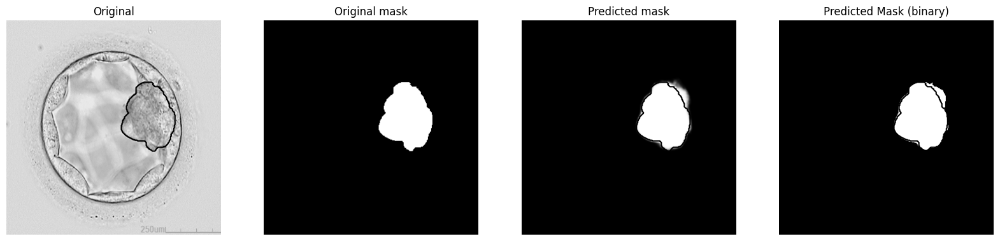

In [ ]:
plot_sample(test_img, test_icm, preds_test, preds_test_t)

In [ ]:
# Compute F1 score
f1 = f1_score(test_icm.flatten(), preds_test_t[:,:,:,0].flatten())


# Compute Intersection over Union (IoU)
iou = iou_score(test_icm, preds_test_t)

print("F1 score for icm:", f1)
print("IoU for icm:", iou)

F1 score for icm: 0.8657452727117756
IoU for icm: 0.7632723513364575


## Prediction and evaluation of unet_zp

In [ ]:

#preds_train = unet_zp.predict(X_train_zp, verbose=1)
preds_test = unet_zp.predict(test_img, verbose=1)
#preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)
preds_test_t = preds_test_t.astype(int)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step 


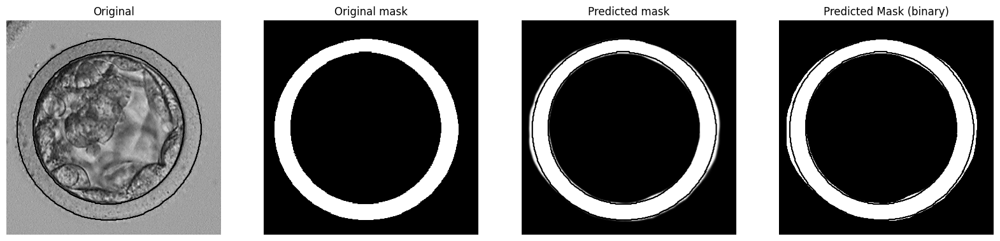

In [ ]:
plot_sample(test_img, test_zp, preds_test, preds_test_t)

In [ ]:
# Compute F1 score
f1 = f1_score(test_zp.flatten(), preds_test_t.flatten())

# Compute Intersection over Union (IoU)
iou = iou_score(test_zp, preds_test_t)

print("F1 score for zp:", f1)
print("IoU for zp:", iou)

F1 score for zp: 0.8833437956446484
IoU for zp: 0.791061556994263


## Prediction and evaluation of unet_te

In [ ]:
#preds_train = unet_te.predict(X_train_te, verbose=1)
preds_test = unet_te.predict(test_img, verbose=1)
#preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)
preds_test_t = preds_test_t.astype(int)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step 


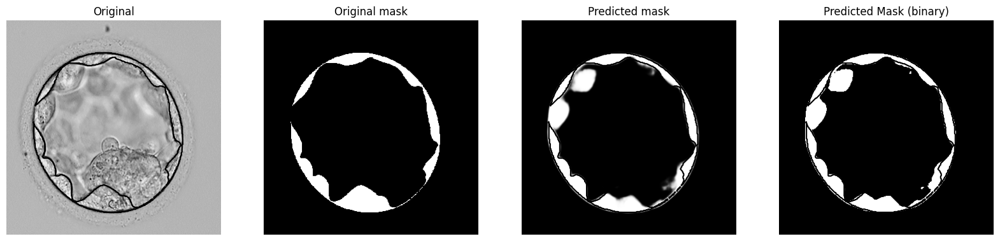

In [ ]:
plot_sample(test_img, test_te, preds_test, preds_test_t)

In [ ]:

# Compute F1 score
f1 = f1_score(test_te.flatten(), preds_test_t.flatten())

# Compute Intersection over Union (IoU)
iou = iou_score(test_te, preds_test_t)

print("F1 score for te:", f1)
print("IoU for te:", iou)

F1 score for te: 0.8348870847575329
IoU for te: 0.716571822211573


## A multi-class model based on the 3 one-class models

### Our 3 models are already trained so no need to re-train the new big model, we will only define a function for the prediction and a function for the visualization of results

### Predict all

In [ ]:
def predict_all(img):
    img = np.array(img)
    if img.max()>1:
        img = img/255
    if (len(img.shape) != 4):
        print("THE SHAPE OF YOUR IMAGE: ",img.shape)
        print("SHAPE MUST BE (n,336,336,1) try np.expand_dims()")

    preds_icm = (unet_icm.predict(img, verbose=1) > 0.5).astype(np.uint8)
    preds_zp = (unet_zp.predict(img, verbose=1)>0.5).astype(np.uint8)
    preds_te = (unet_te.predict(img, verbose=1)>0.5).astype(np.uint8)

    preds_all = np.zeros(shape=(336, 336, 4))
    preds_all[:,:,0] = preds_icm.squeeze()
    preds_all[:,:,1] = preds_zp.squeeze()
    preds_all[:,:,2] = preds_te.squeeze()
    preds_all[:,:,3] = img.squeeze()

    return (preds_all.squeeze())



In [ ]:
pp = predict_all(np.expand_dims(test_img[14],axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


### Show results

In [ ]:
def show_all(img, pred_img):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    img = img.squeeze()
    pred_img = pred_img.squeeze()
    ax[0].imshow(img,cmap="gray")
    ax[0].set_title('Original image')
    ax[0].set_axis_off()
    ax[1].imshow(pred_img,cmap="gray")
    ax[1].set_title('Segmented image')
    ax[1].set_axis_off()
    plt.show()



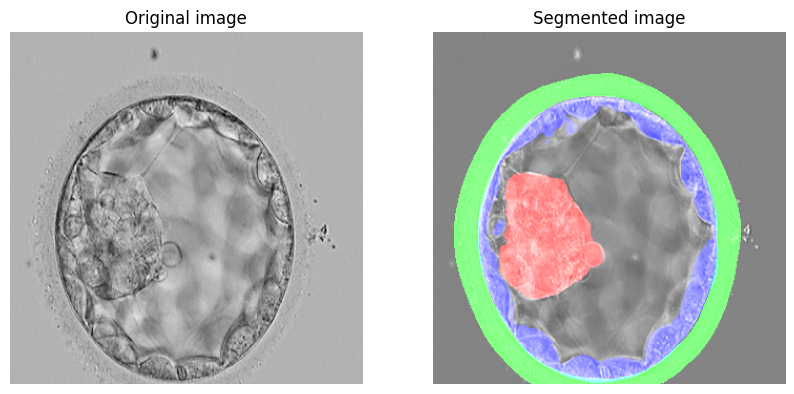

In [ ]:
show_all(test_img[14],pp)

### Another example

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


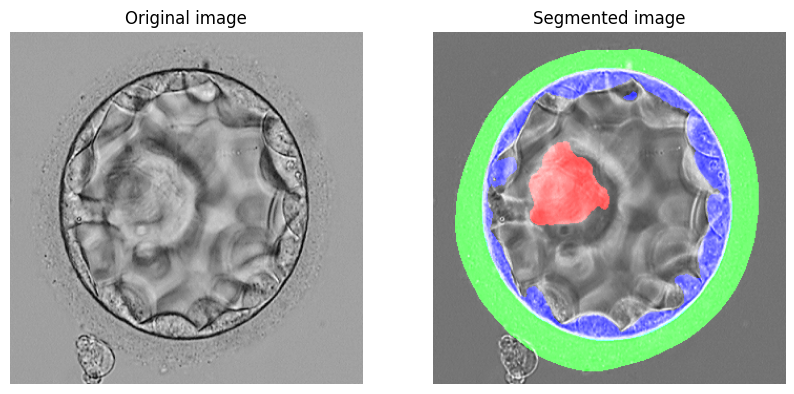

In [ ]:
pp = predict_all(np.expand_dims(test_img[26],axis=0))
show_all(test_img[26],pp)

# !Explainability!

### Here we will implement GradCAM to add a layer of explainability to our model.
### GradCAM is a post-hoc explainability method

In [ ]:

def grad_cam(model, img,
             layer_name, label_name=None,
             category_id=None):
    """Get a heatmap by Grad-CAM.

    Args:
        model: A model object, build from tf.keras 2.X.
        img: An image ndarray.
        layer_name: A string, layer name in model.
        label_name: A list or None,
            show the label name by assign this argument,
            it should be a list of all label names.
        category_id: An integer, index of the class.
            Default is the category with the highest score in the prediction.

    Return:
        A heatmap ndarray(without color).
    """
    img = np.squeeze(img)
    img_tensor = np.expand_dims(img, axis=0)
    conv_layer = model.get_layer(layer_name)
    heatmap_model = Model(model.inputs, [conv_layer.output, model.output])

    with tf.GradientTape() as gtape:
        conv_output, predictions = heatmap_model(img_tensor)
        output = predictions
        grads = gtape.gradient(output, conv_output)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return np.squeeze(heatmap)

def show_imgwithheat(img, heatmap, alpha=0.4, return_array=False):
    """Show the image with heatmap.

    Args:
        img_path: string.
        heatmap: image array, get it by calling grad_cam().
        alpha: float, transparency of heatmap.
        return_array: bool, return a superimposed image array or not.
    Return:
        None or image array.
    """
    img = img*255
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = (heatmap*255).astype("uint8")
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    imgwithheat = Image.fromarray(superimposed_img)
    #try:
     #   display(imgwithheat)
    #except NameError:
     #   imgwithheat.show()

    if return_array:
#         return Image.fromarray(superimposed_img)
        return superimposed_img
heatmap = grad_cam(unet_icm, test_img[28],"conv2d_17")
output_img_gc = show_imgwithheat(test_img[28], heatmap, return_array=True)

## GradCAM on all regions at the same time

In [ ]:
conv = [["conv2d"],[],[]]
for i in range (1,19):
    conv[0].append(f"conv2d_{i}")
for i in range (19,38):
    conv[1].append(f"conv2d_{i}")
for i in range (38,57):
    conv[2].append(f"conv2d_{i}")

In [ ]:
def grad_cam_all(img, x):
    img = np.array(img)
    if (img.shape != 3):
        img = np.expand_dims(img,axis=-1)
    h1 = grad_cam(unet_icm, img,conv[0][x])
    h2 = grad_cam(unet_zp, img,conv[1][x])
    h3 = grad_cam(unet_te, img,conv[2][x])

    return (h1+h2+h3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


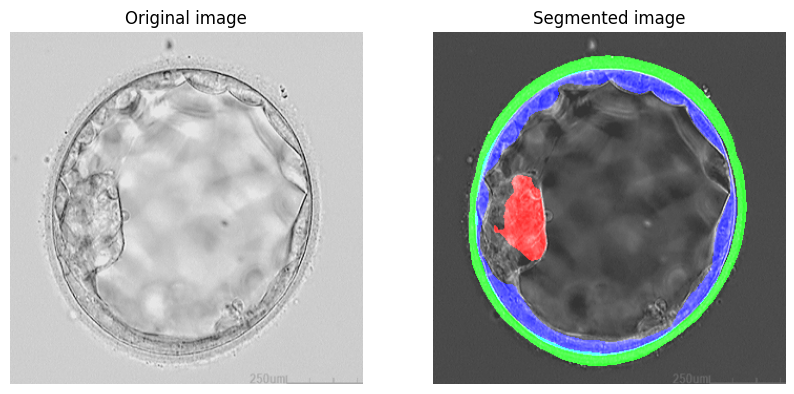

In [ ]:
pp = predict_all(np.expand_dims(test_img[13],axis=0))
show_all(test_img[13],pp)

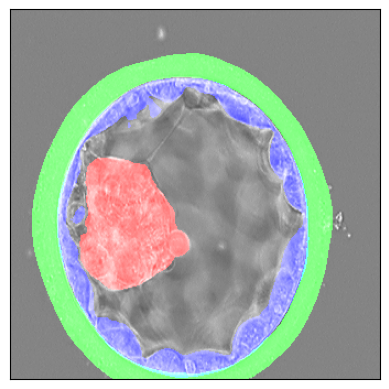

In [ ]:
fig = plt.imshow(pp)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.savefig('seg.png', bbox_inches='tight')

In [ ]:
heatmap = grad_cam_all(test_img[13],18)
output_img_gc = show_imgwithheat(test_img[13], heatmap, return_array=True)

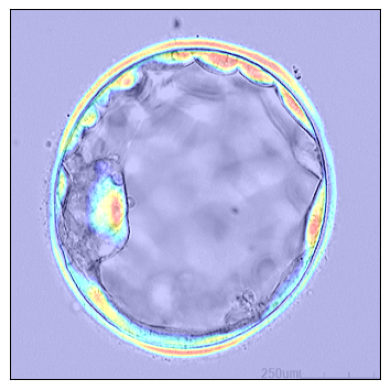

In [ ]:
fig = plt.imshow(output_img_gc)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.savefig('foo.png', bbox_inches='tight')

## GradCAM on all the convolutional layers

In [ ]:
def grad_cam_all_conv(img):
    k=0
    fig, ax = plt.subplots(4, 5, figsize=(50, 50))
    for i in range(4):
        for j in range(5):
            heatmap = grad_cam_all(img,k)
            k=k+1
            output_img_gc = show_imgwithheat(img, heatmap, return_array=True)
            ax[i][j].imshow(output_img_gc)
            ax[i][j].set_title(f"convolutional layer {k}",fontsize = 30)
            ax[i][j].set_axis_off()
            if (k==19):
                break
    pp = predict_all(np.expand_dims(img,axis=0))
    ax[3][4].imshow(pp,cmap='gray')
    ax[3][4].set_title("Segmentation",fontsize = 30)
    ax[3][4].set_axis_off()

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


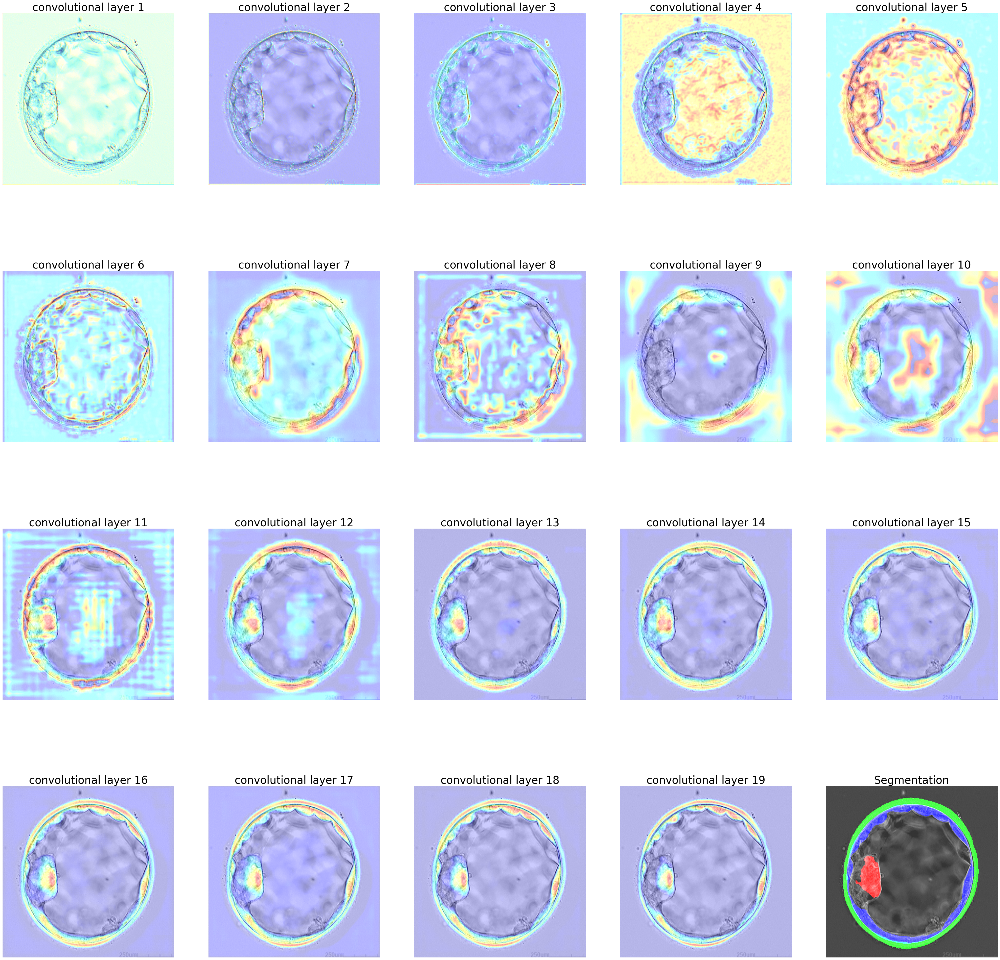

In [ ]:
grad_cam_all_conv(test_img[13])